In [ ]:
from google.colab import files
files.upload()

Saving demand-forecasting-kernels-only.zip to demand-forecasting-kernels-only.zip


{'demand-forecasting-kernels-only.zip': b'PK\x03\x04-\x00\x00\x00\x08\x00\xc1\xa6\x8fOl\x07\x90!\xff\xff\xff\xff\xff\xff\xff\xff\x15\x00\x14\x00sample_submission.csv\x01\x00\x10\x00\xab\x02\x06\x00\x00\x00\x00\x00!\x88\x01\x00\x00\x00\x00\x00D\xddM\x8e4=V\x80\xd1y\xaf\x85A\xda\xf7\xcf\xb9\x1c$\x18 1\xeb\xfdK\xe8K\x1f\x17\x93wD\x04\xd0\xfdDVU\x9e\xb8\xd7\xff\xf3_\xff\xf1\xef\xff\xfc\xdf\xff\xfe\xf7\xbf>\xffQ\xfb_\xeb\x9f\x7f\xf6?\xff\xc4?\xff\xe4?\xff\xd4?\xff\xf4?\xff\xcc?\xff\x9c\x7f\xfe\xf9\xfe\xfe\x87\xef%\xbfk\xd6\xef\xa2\xf5\xbbj\xfd.[\xbf\xeb\xd6\xef\xc2\xf5\xbbr\xfd.]\xbfk\xf7\xef\xda}\xff\xf7\xfd\xae\xdd\xbfk\xf7\xef\xda\xfd\xbbv\xff\xae\xdd\xbfk\xf7\xef\xda\xfd\xbb6~\xd7\xc6\xef\xda\xb8\xff\xc7\xfe\xae\x8d\xdf\xb5\xf1\xbb6~\xd7\xc6\xef\xda\xf8]\x1b\xbfk\xf3wm\xfe\xae\xcd\xdf\xb5y\xff?\xfd]\x9b\xbfk\xf3wm\xfe\xae\xcd\xdf\xb5\xf9\xbb\xb6~\xd7\xd6\xef\xda\xfa][\xbfk\xeb\xfe\xc7\xf4\xbb\xb6~\xd7\xd6\xef\xda\xfa][\xbfk\xfbwm\xff\xae\xed\xdf\xb5\xfd\xbb\xb6\x7f\xd7\xf6\xfd\xcf\xf8wm

In [ ]:
!unzip -q "demand-forecasting-kernels-only.zip"

In [ ]:
import numpy as np
import pandas as pd
from pandas import datetime
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
def parser(x):
    return datetime.strptime(x, '%Y-%m-%d')

sales = pd.read_csv('train.csv', parse_dates = [0], date_parser = parser)

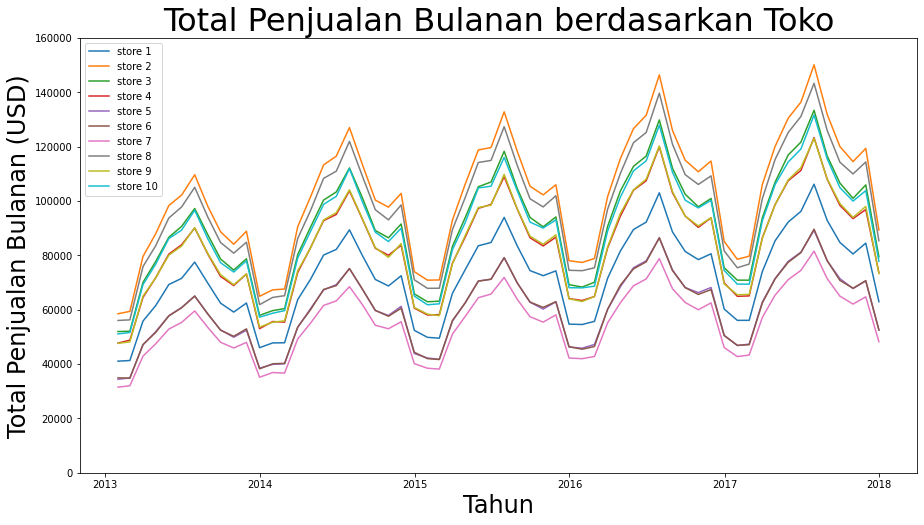

In [ ]:
plt.figure(figsize=(15,8));
for i in range(1,11):
    month_df = sales[sales.store==i].resample('M',on='date').sum()
    x= np.array(month_df.index)
    y=np.array(month_df.sales)
    plt.plot(x,y,label = 'store %s' % i)
plt.legend(loc='upper left')
plt.title("Total Penjualan Bulanan berdasarkan Toko", fontsize=32)
plt.ylabel("Total Penjualan Bulanan (USD)", fontsize=24)
plt.xlabel("Tahun", fontsize=24)
plt.ylim(0, 160000)
plt.show()

In [ ]:
sales.store = sales.store.astype(str)
sales.dtypes

date     datetime64[ns]
store            object
item              int64
sales             int64
dtype: object

In [ ]:
sales.to_csv('tableau_train.csv', index=True)

In [ ]:
month_df.head()

,store,item,sales
date,,,
2013-01-31,15500,39525,51095
2013-02-28,14000,35700,51624
2013-03-31,15500,39525,69249
2013-04-30,15000,38250,76791
2013-05-31,15500,39525,86210


In [ ]:
sales = sales.set_index('date')
sales['month'] = sales.index.month
sales['year'] = sales.index.year
print(len(sales))
sales.head()

913000


,store,item,sales,month,year
date,,,,,
2013-01-01,1,1,13,1,2013
2013-01-02,1,1,11,1,2013
2013-01-03,1,1,14,1,2013
2013-01-04,1,1,13,1,2013
2013-01-05,1,1,10,1,2013


In [ ]:
# Restruktur Dataset
store_list = []
items_by_store = []
daily_sales_list = []
daily_diff_list = []
weekly_sales_list = []
weekly_diff_list = []
monthly_sales_list = []
monthly_diff_list = []

# Memisahkan penjualan berdasarkan toko untuk training

for i in range(1, 11):
    store = sales[sales.store == i]
    store_list.append(store)
    
# Kolom terpisah untuk menyimpan kolom non penjualan
    
for i in store_list:
    sales_items = i.drop(columns='sales')
    items_by_store.append(sales_items)


# Convert our time series to daily stationary for each store

for i in store_list:
    daily_sales = i.reset_index().series.resample('D', on='date').sum()
    daily_diff = daily_sales.sales.diff(periods = 1)
    daily_diff = pd.DataFrame(daily_diff)
    daily_diff = daily_diff[1:]
    daily_sales = pd.DataFrame(daily_sales.sales)
    daily_sales_list.append(daily_sales)
    daily_diff_list.append(daily_diff)
    
# Convert our time series to weekly stationary for each store

for i in store_list:
    weekly_sales = i.reset_index().resample('W', on='date').sum()
    weekly_diff = weekly_sales.sales.diff(periods = 1)
    weekly_diff = pd.DataFrame(weekly_diff)
    weekly_diff = weekly_diff[1:]
    weekly_sales = pd.DataFrame(weekly_sales.sales)
    weekly_sales_list.append(weekly_sales)
    weekly_diff_list.append(weekly_diff)
    
    
# Convert our time series to monthly stationary for each store

for i in store_list:
    monthly_sales = i.reset_index().resample('M', on='date').sum()
    monthly_diff = monthly_sales.sales.diff(periods = 1)
    monthly_diff = pd.DataFrame(monthly_diff)
    monthly_diff = monthly_diff[1:]
    monthly_sales = pd.DataFrame(monthly_sales.sales)
    monthly_sales_list.append(monthly_sales)
    monthly_diff_list.append(monthly_diff)

AttributeError: ignored

In [ ]:
store1_daily_sales = daily_sales_list[0]
print(len(store1_daily_sales))
store1_daily_sales.head()

IndexError: ignored

In [ ]:
sales_train = sales[sales.year < 2017]
print(len(sales_train))
sales_train.head()

730500


,store,item,sales,month,year
date,,,,,
2013-01-01,1,1,13,1,2013
2013-01-02,1,1,11,1,2013
2013-01-03,1,1,14,1,2013
2013-01-04,1,1,13,1,2013
2013-01-05,1,1,10,1,2013


In [ ]:
sales_test = sales[sales.year == 2017]
print(len(sales_test))
sales_test.head()

182500


,store,item,sales,month,year
date,,,,,
2017-01-01,1,1,19,1,2017
2017-01-02,1,1,15,1,2017
2017-01-03,1,1,10,1,2017
2017-01-04,1,1,16,1,2017
2017-01-05,1,1,14,1,2017


In [ ]:
# Restructure Train Data

store_train_list = []
items_by_store_train = []
daily_sales_train_list = []
daily_diff_train_list = []
weekly_sales_train_list = []
weekly_diff_train_list = []
monthly_sales_train_list = []
monthly_diff_train_list = []

# Separate sales by store for the training set

for i in range(1, 11):
    store = sales_train[sales_train.store == i]
    store_train_list.append(store)
    
# Create a separate dataframe to store non-sales columns for each store in our list
    
for i in store_train_list:
    sales_items = i.drop(columns='sales')
    items_by_store_train.append(sales_items)


In [ ]:

# Convert our time series to daily stationary for each store

for i in store_train_list:
    daily_sales = i.reset_index().resample('D', on='date').sum()
    daily_diff = daily_sales.sales.diff(periods = 1)
    daily_diff = pd.DataFrame(daily_diff)
    daily_diff = daily_diff[1:]
    daily_sales = pd.DataFrame(daily_sales.sales)
    daily_sales_train_list.append(daily_sales)
    daily_diff_train_list.append(daily_diff)
    
# Convert our time series to weekly stationary for each store

for i in store_train_list:
    weekly_sales = i.reset_index().resample('W', on='date').sum()
    weekly_diff = weekly_sales.sales.diff(periods = 1)
    weekly_diff = pd.DataFrame(weekly_diff)
    weekly_diff = weekly_diff[1:]
    weekly_sales = pd.DataFrame(weekly_sales.sales)
    weekly_sales_train_list.append(weekly_sales)
    weekly_diff_train_list.append(weekly_diff)
    
# Convert our time series to monthly stationary for each store

for i in store_train_list:
    monthly_sales = i.reset_index().resample('M', on='date').sum()
    monthly_diff = monthly_sales.sales.diff(periods = 1)
    monthly_diff = pd.DataFrame(monthly_diff)
    monthly_diff = monthly_diff[1:]
    monthly_sales = pd.DataFrame(monthly_sales.sales)
    monthly_sales_train_list.append(monthly_sales)
    monthly_diff_train_list.append(monthly_diff)

AttributeError: ignored

In [ ]:
sales_test = sales[sales.year == 2017]
print(len(sales_test))
sales_test.head()

182500


,store,item,sales,month,year
date,,,,,
2017-01-01,1,1,19,1,2017
2017-01-02,1,1,15,1,2017
2017-01-03,1,1,10,1,2017
2017-01-04,1,1,16,1,2017
2017-01-05,1,1,14,1,2017
